In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.optimizers import RMSprop
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.callbacks import CSVLogger
from keras.models import load_model
import sklearn.metrics as metrics
import pandas as pd

# Data
path = "../"

training_data_dir = path + "data/training" # 10633 * 2
validation_data_dir = path + "data/validation" # 1600 * 2
test_data_dir = path + "data/test" # 2000

# Hyperparams
IMAGE_SIZE = 200
IMAGE_WIDTH, IMAGE_HEIGHT = IMAGE_SIZE, IMAGE_SIZE
EPOCHS = 5
BATCH_SIZE = 32
TEST_SIZE = 30

input_shape = (IMAGE_WIDTH, IMAGE_HEIGHT, 3)



Using TensorFlow backend.


In [2]:
# Model 5
model = Sequential()

model.add(Conv2D(8, 3, 3, border_mode='same', input_shape=input_shape, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(16, 3, 3, border_mode='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, 3, 3, border_mode='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, 3, 3, border_mode='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64, activation='relu')) #256
model.add(Dropout(0.5))

model.add(Dense(64, activation='relu')) #256
model.add(Dropout(0.5))

model.add(Dense(1))
model.add(Activation('sigmoid'))
    
model.compile(loss='binary_crossentropy',
            optimizer=RMSprop(lr=0.0001),
            metrics=['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(8, (3, 3), input_shape=(200, 200,..., activation="relu", padding="same")`
  after removing the cwd from sys.path.
C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(16, (3, 3), activation="relu", padding="same")`
  import sys
C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), activation="relu", padding="same")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", padding="same")`
  del sys.path[0]


In [3]:
# Data augmentation
training_data_generator = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
validation_data_generator = ImageDataGenerator(rescale=1./255)
test_data_generator = ImageDataGenerator(rescale=1./255)

# Data preparation
training_generator = training_data_generator.flow_from_directory(
    training_data_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode="binary")
validation_generator = validation_data_generator.flow_from_directory(
    validation_data_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode="binary")
test_generator = test_data_generator.flow_from_directory(
    test_data_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=1,
    class_mode="binary", 
    shuffle=False)


Found 21258 images belonging to 2 classes.
Found 3200 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [5]:
TRAINING_LOGS_FILE = "training_log_final.csv"
MODEL_SUMMARY_FILE = "model_summary_final.txt"
TEST_FILE = "test_file_lg_final.csv"
MODEL_FILE = "model2-5ep-final-w.h5"
# EPOCHS = 5

# Training
model.fit_generator(
    training_generator,
    steps_per_epoch=len(training_generator.filenames) // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=len(validation_generator.filenames) // BATCH_SIZE,
    callbacks=[ CSVLogger(TRAINING_LOGS_FILE,
                                            append=False,
                                            separator=";")], 
    verbose=1)
model.save_weights(MODEL_FILE)
model.save('model2-5epochs-final.h5')


Epoch 1/5
664/664 [==============================] - 578s 871ms/step - loss: 0.2207 - acc: 0.9108 - val_loss: 0.0384 - val_acc: 0.9797
Epoch 2/5
664/664 [==============================] - 509s 766ms/step - loss: 0.0428 - acc: 0.9901 - val_loss: 0.0689 - val_acc: 0.9669
Epoch 3/5
664/664 [==============================] - 408s 615ms/step - loss: 0.0241 - acc: 0.9938 - val_loss: 0.0711 - val_acc: 0.9875
Epoch 4/5
664/664 [==============================] - 413s 623ms/step - loss: 0.0142 - acc: 0.9964 - val_loss: 0.0341 - val_acc: 0.9950
Epoch 5/5
664/664 [==============================] - 436s 657ms/step - loss: 0.0102 - acc: 0.9970 - val_loss: 0.0203 - val_acc: 0.9931


In [24]:
test_generator.filenames[0]

'dog\\dog100.jpg'

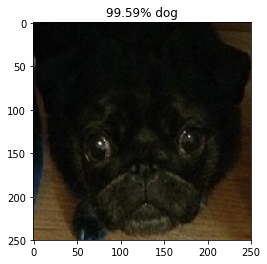

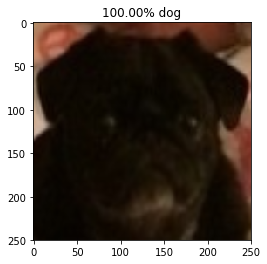

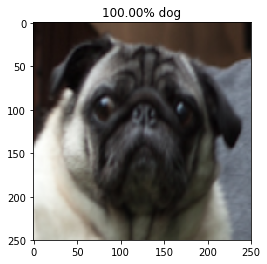

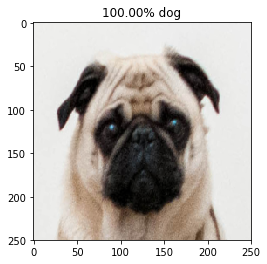

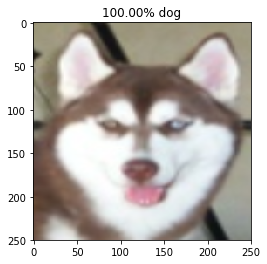

...

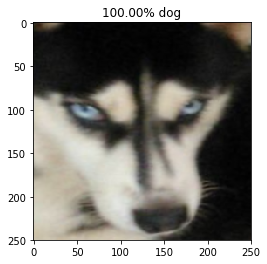

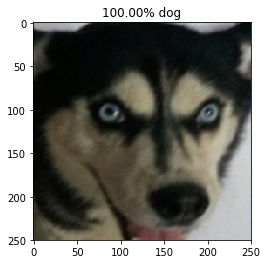

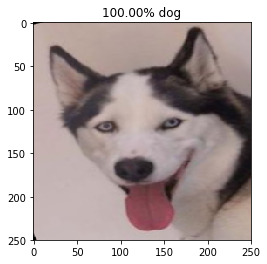

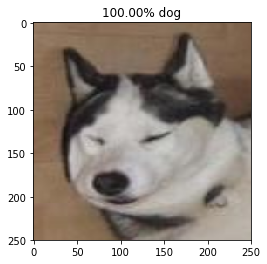

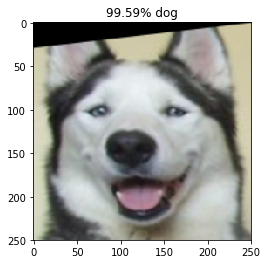

In [26]:
# TESTING WITH LARGE, REPETITIVE DATASET
open(TEST_FILE,"w")
probabilities = model.predict_generator(test_generator, TEST_SIZE)
for index, probability in enumerate(probabilities):
    image_path = test_data_dir + "/" +test_generator.filenames[index]
    img = mpimg.imread(image_path)
    with open(TEST_FILE,"a") as fh:
        fh.write(str(probability[0]) + image_path + "\n")
    plt.imshow(img)
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% human")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% dog")
    plt.show()

## With shorter, new dataset for testing

In [8]:
# Data augmentation
test_data_dir2 = path + "data/test2" # 28
test_data_generator2 = ImageDataGenerator(rescale=1./255)

# Data preparation

test_generator2 = test_data_generator2.flow_from_directory(
    test_data_dir2,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=1,
    class_mode="binary", 
    
    shuffle=False) #antes era false

Found 70 images belonging to 2 classes.


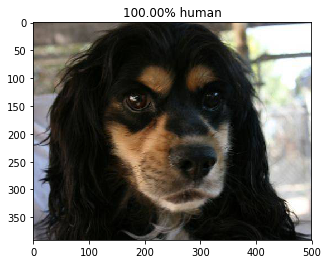

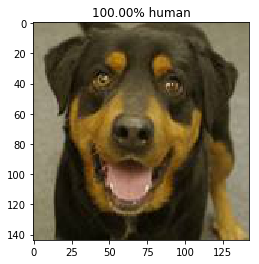

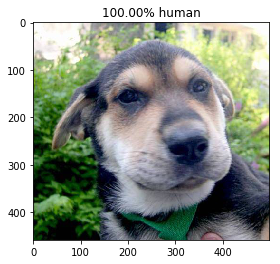

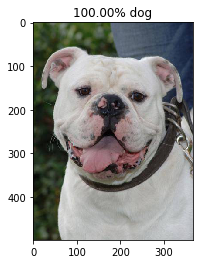

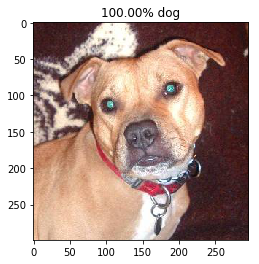

...

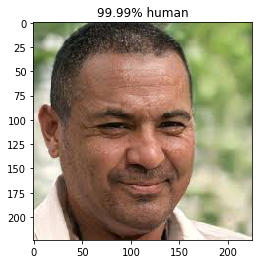

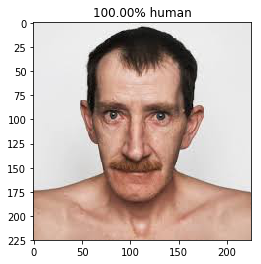

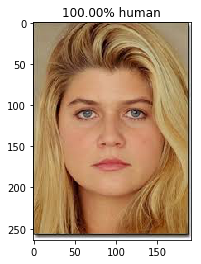

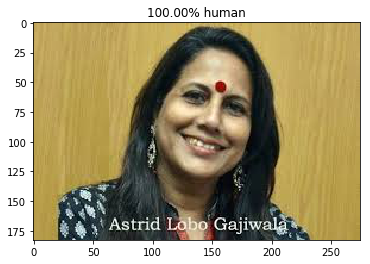

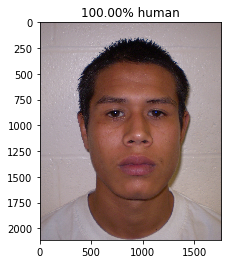

In [9]:
# Testing
TEST_FILE2 = "test_file_sm_final.csv"
open(TEST_FILE2,"w")
probabilities2 = model.predict_generator(test_generator2, 70)
for index, probability in enumerate(probabilities2):
    image_path = test_data_dir2 + "/" +test_generator2.filenames[index]
    img = mpimg.imread(image_path)
    with open(TEST_FILE2,"a") as fh:
        fh.write(str(probability[0]) + " for: " + image_path + "\n")
    plt.imshow(img)
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% human")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% dog")
    plt.show()


In [11]:
df2 = pd.read_csv('test_file_sm_final.csv')

In [14]:
df2.head()

,prob,img,Unnamed: 2
0,0.999999,../data/test2/dog\119.jpg,NaN
1,0.999968,../data/test2/dog\137.jpg,NaN
2,0.999998,../data/test2/dog\18.jpg,NaN
3,0.000014,../data/test2/dog\182.jpg,NaN
4,0.000040,../data/test2/dog\2.jpg,NaN


In [19]:
true_classes = test_generator2.classes
len(true_classes)

70

In [16]:
prob = df2['prob']
predicted2 = []
for i in prob:
    if i <0.5:
        predicted2.append(0)
    else:
        predicted2.append(1)

In [17]:
df2['pred'] = predicted2

In [18]:
df2.head()

,prob,img,Unnamed: 2,pred
0,0.999999,../data/test2/dog\119.jpg,NaN,1
1,0.999968,../data/test2/dog\137.jpg,NaN,1
2,0.999998,../data/test2/dog\18.jpg,NaN,1
3,0.000014,../data/test2/dog\182.jpg,NaN,0
4,0.000040,../data/test2/dog\2.jpg,NaN,0


In [20]:
df2['true_c'] = true_classes

In [21]:
df2.head()

,prob,img,Unnamed: 2,pred,true_c
0,0.999999,../data/test2/dog\119.jpg,NaN,1,0
1,0.999968,../data/test2/dog\137.jpg,NaN,1,0
2,0.999998,../data/test2/dog\18.jpg,NaN,1,0
3,0.000014,../data/test2/dog\182.jpg,NaN,0,0
4,0.000040,../data/test2/dog\2.jpg,NaN,0,0


In [22]:
report = metrics.classification_report(df2['true_c'], df2['pred'], target_names=['dog','human'])
print(report)

              precision    recall  f1-score   support

         dog       0.79      0.54      0.64        35
       human       0.65      0.86      0.74        35

   micro avg       0.70      0.70      0.70        70
   macro avg       0.72      0.70      0.69        70
weighted avg       0.72      0.70      0.69        70

